In [2]:
import geopandas as gpd
import numpy as np
import pandas as pd
import hyp3_sdk as sdk
import asf_search as asf
import pyproj
import json
import rasterio as rio
import matplotlib.pyplot as plt
import seaborn as sns
import sys

sys.path.append('../')

from PIL import Image
from shapely.geometry import Polygon
from config import hyp3_username, hyp3_password

%matplotlib inline

In [17]:
def display_img(imgpath):
    with rio.open(imgpath) as scene:
        image_data = scene.read(1)
        no_data_value = scene.nodata
        image_data = np.where(image_data == no_data_value, np.nan, image_data)

    plt.figure(figsize=(50,50))
    plt.imshow(image_data, cmap='gray', vmin=np.nanmin(image_data), vmax=np.nanmax(image_data))
    plt.colorbar()
    plt.title('GeoTIFF Visualization')
    plt.show()
    

In [22]:
med_vv_masked = '/home1/08452/kaipak/corral-slice/datasets/SAR/hyp3_mediterranean_30m_stuhlmacher_gade_unlabled/vv_masked/S1A_IW_GRDH_1SDV_20141006T171315_20141006T171340_002712_00308D_06C0_VV_landmask.tif'
med_vv = '/home1/08452/kaipak/corral-slice/datasets/SAR/hyp3_mediterranean_30m_stuhlmacher_gade_unlabled/vv/S1A_IW_GRDH_1SDV_20141006T171315_20141006T171340_002712_00308D_06C0_VV.tif'
med_mask = '/work/08452/kaipak/ls6/datasets/med_region_LC100_global_v3.0.1_2019-nrt_Discrete-Classification-proba_EPSG-4326.tif'

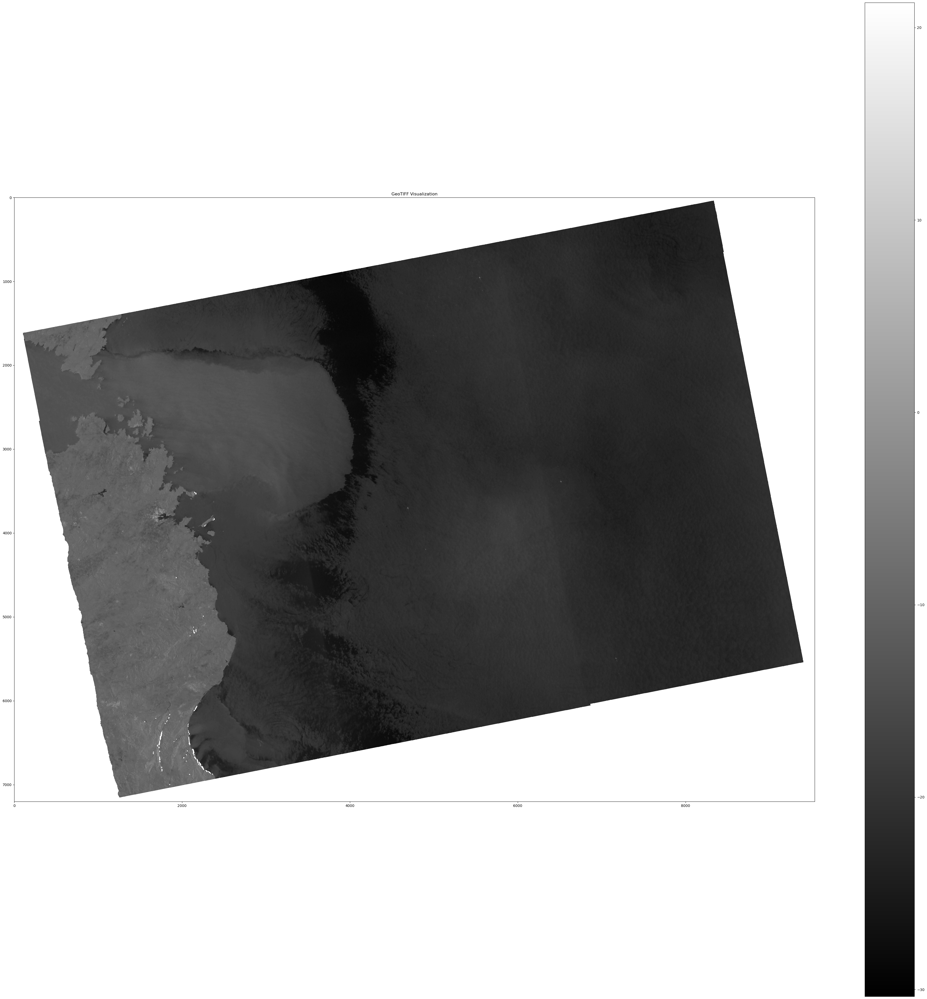

In [21]:
display_img(med_vv)

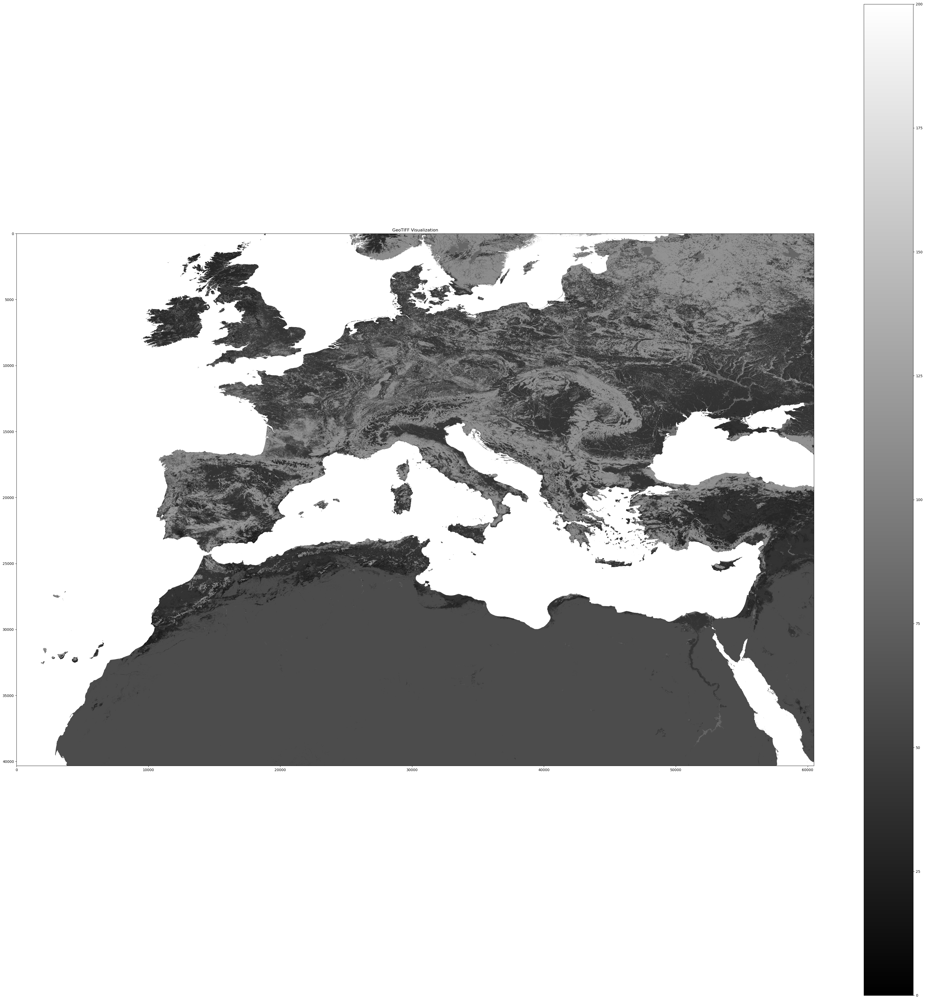

In [23]:
display_img(med_mask)

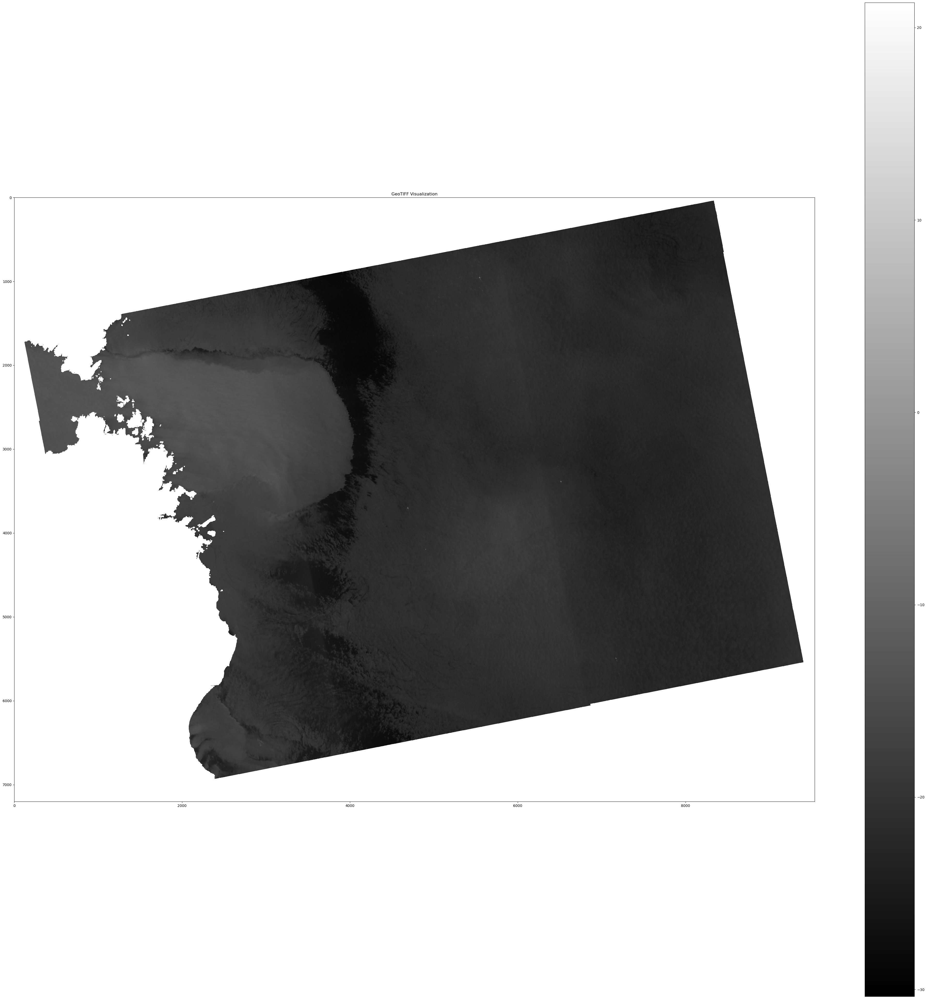

In [46]:
display_img('/work/08452/kaipak/ls6/datasets/test_sar_mask/output/S1A_IW_GRDH_1SDV_20141006T171315_20141006T171340_002712_00308D_06C0_VV_landmask.tif')

In [42]:
# Read the landcover GeoTIFF using rasterio
with rio.open(med_mask) as land_src:
    landcover_data = land_src.read(1)
    land_transform = land_src.transform
    land_bounds = land_src.bounds

# Define land classes to mask (e.g., water bodies)
# For example, assuming water bodies are represented by value 210 in the landcover data
water_classes = [200]
land_mask = np.isin(landcover_data, water_classes, invert=True)


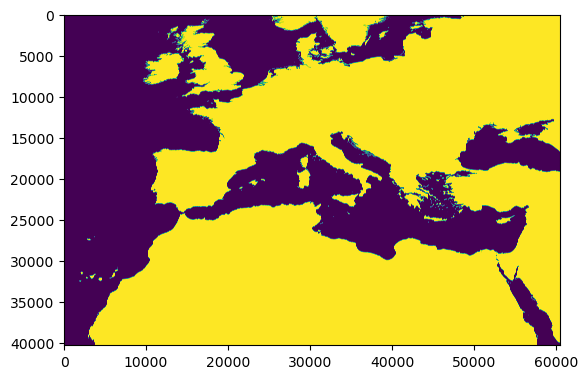

In [43]:
plt.imshow(land_mask)

In [34]:
with rio.open (med_mask) as dataset:
    image = dataset.read(1)

In [35]:
image.max()

200

In [36]:
image.min()

0

In [39]:
np.unique(image)

array([  0,  20,  30,  40,  50,  60,  70,  80,  90, 100, 111, 112, 113,
       114, 115, 116, 121, 122, 123, 124, 125, 126, 200], dtype=uint8)

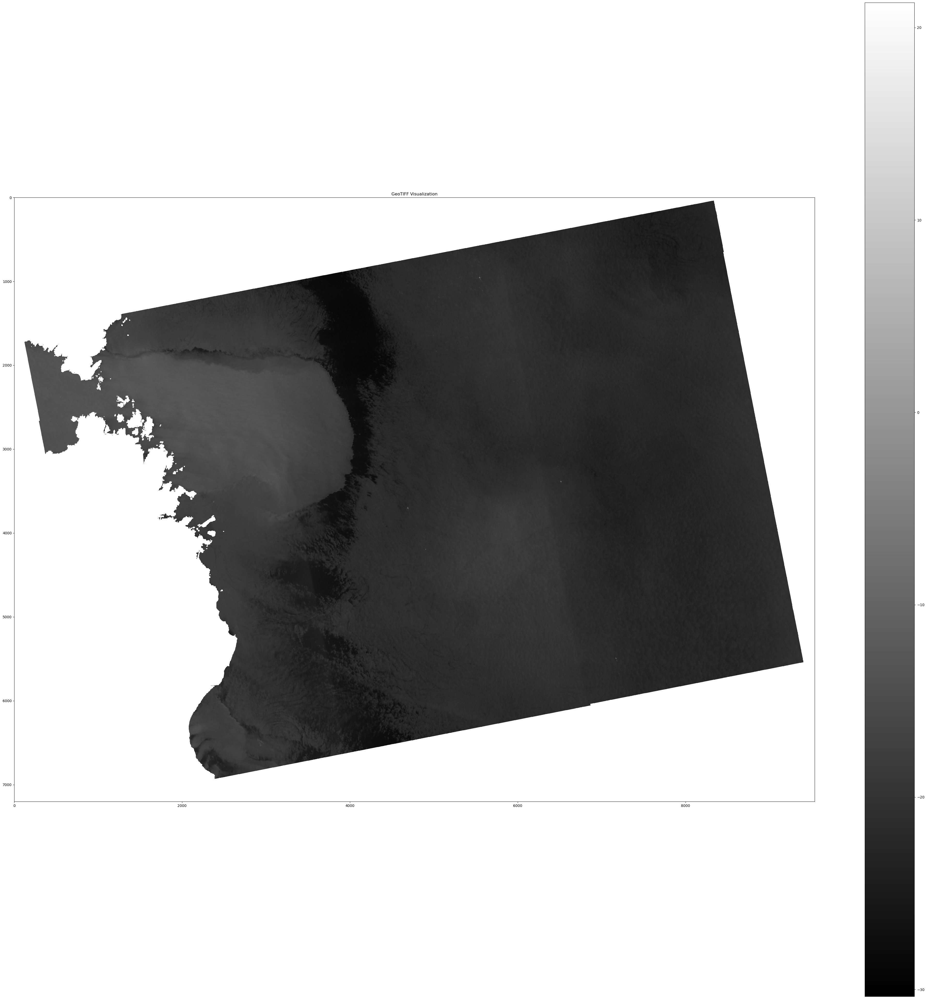

In [48]:
display_img('/work/08452/kaipak/ls6/datasets/test_sar_mask/output/S1A_IW_GRDH_1SDV_20141006T171315_20141006T171340_002712_00308D_06C0_VV_landmask.tif')